<a href="https://colab.research.google.com/github/minsung6333/AIFEL_Quest/blob/main/exp_14.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Segmentation map으로 도로 이미지 만들기**

1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다.
  - 데이터 분석 과정 및 한 가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.
2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다.
  - U-Net generator, discriminator 모델 구현이 완료되어 train_step의 output을 확인하고 개선하였다.
3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다.
  - 10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# 1. 데이터 호출
- 1000개의 학습데이터와 5개의 평가데이터로 이루어진 cityscape 데이터 불러오기.

In [ ]:
import os

data_path = "/content/drive/MyDrive/아이펠/EXPLORATION_RS6/data/cityscapes/train/"

print("The number of train examples: ", len(os.listdir(data_path)))

The number of train examples:  1000


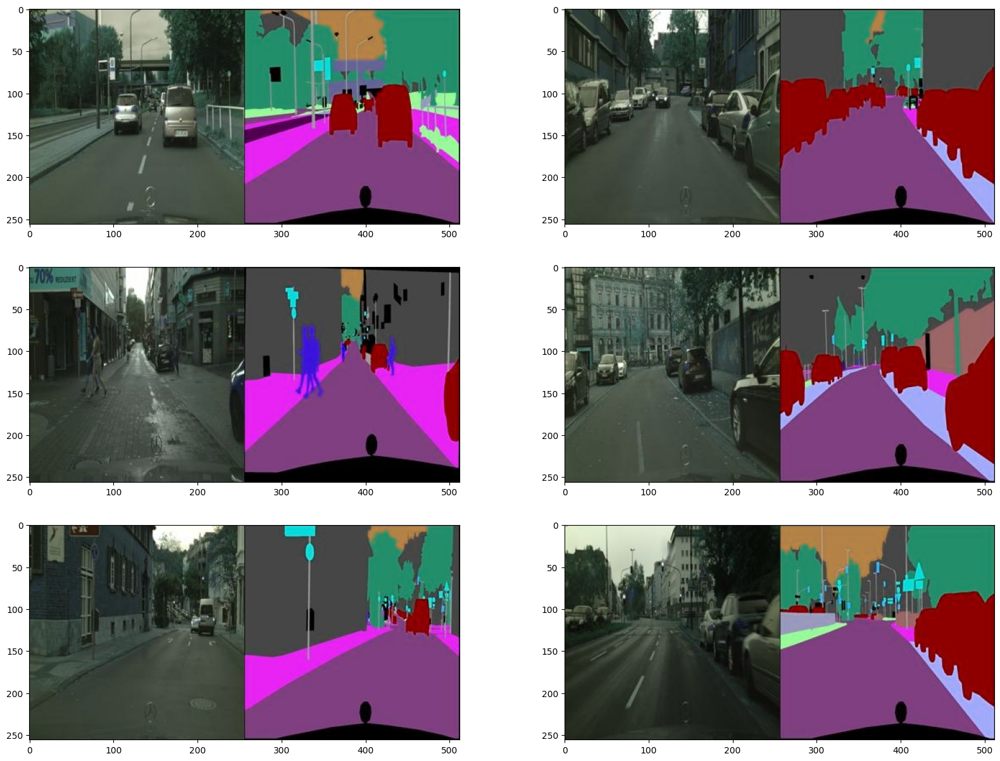

In [ ]:
# 이미지 확인
import cv2
import numpy as np
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 15))
for i in range(1, 7):
    f = data_path + os.listdir(data_path)[np.random.randint(1000)] # 이미지 리스트에서 랜덤
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3, 2, i)
    plt.imshow(img)

In [ ]:
# 이미지 하나의 크기 확인
f = data_path + os.listdir(data_path)[0]
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)

(256, 512, 3)


# 2. 이미지 가공
- 데이터의 학습을 위한 라벨데이터와 원본데이터의 분리

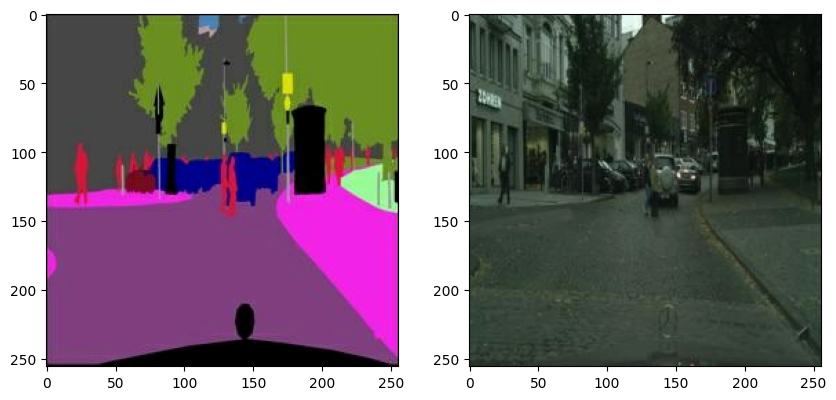

In [ ]:
import tensorflow as tf

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)

    w = tf.shape(img)[1] // 2
    ground_truth = img[:, :w, :]
    ground_truth = tf.cast(ground_truth, tf.float32)
    input_image = img[:, w:, :]
    input_image = tf.cast(input_image, tf.float32)
    return normalize(input_image), normalize(ground_truth)

f = data_path + os.listdir(data_path)[1]
input_image, ground_truth = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1); plt.imshow(denormalize(input_image))
plt.subplot(1,2,2); plt.imshow(denormalize(ground_truth))

# 3. Data augmentation
- Data augmentation을 위하여 원본 데이터를 상하 또는 좌우로 뒤집거나 회전 또는 crop 진행
- 각 50% 확률로 가로/세로/회전/Crop 진행하였음


In [ ]:
from tensorflow import image
from tensorflow.keras.preprocessing.image import random_rotation

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다.
def apply_augmentation(sketch, colored):
    stacked = tf.concat([sketch, colored], axis=-1)

    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)

    out = image.random_crop(padded, size=[256, 256, 6])

    out = image.random_flip_left_right(out)
    out = image.random_flip_up_down(out)

    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)

    return out[...,:3], out[...,3:]

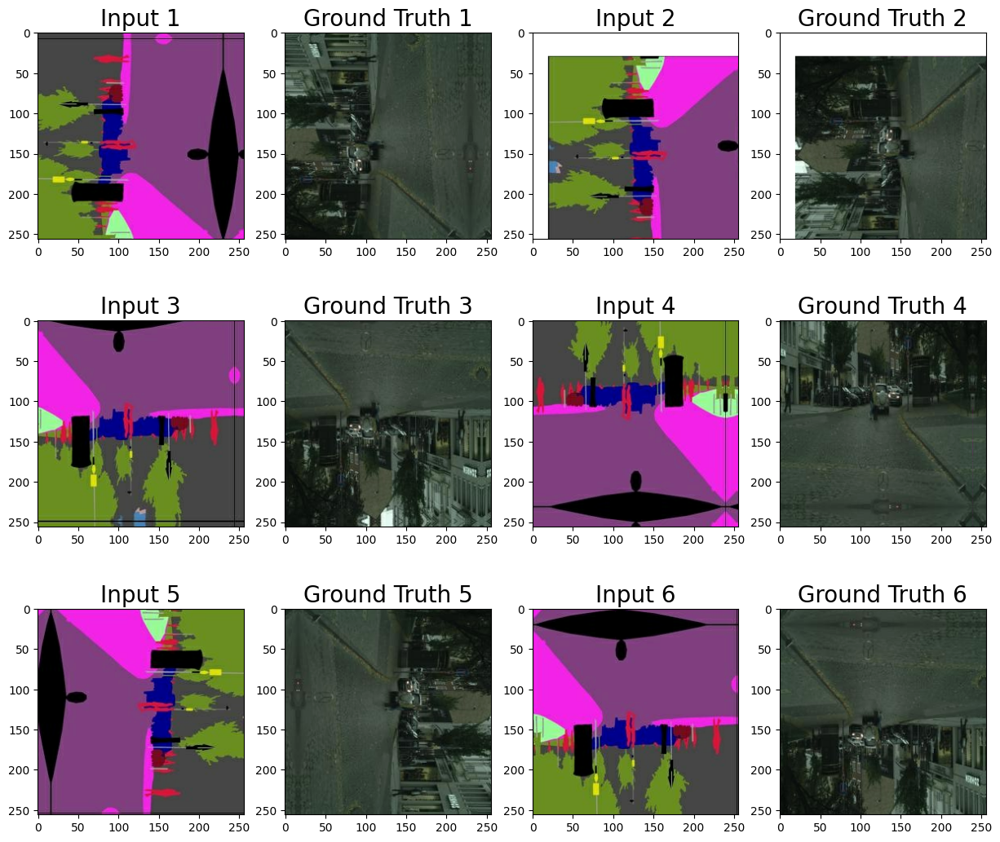

In [ ]:
#시각화
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_input, augmented_gt = apply_augmentation(input_image, ground_truth)

    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_input)); plt.title(f"Input {img_n}", fontsize=20)
    plt.subplot(3,4,i+1);
    plt.imshow(denormalize(augmented_gt)); plt.title(f"Ground Truth {img_n}", fontsize=20)
    img_n += 1

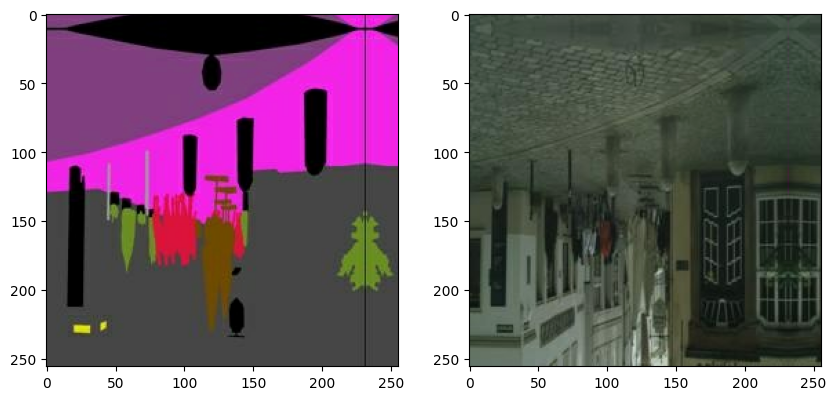

In [ ]:
#적용된 시각화 확인
from tensorflow import data

def get_train(img_path):
    input_image, ground_truth = load_img(img_path)
    input_image, ground_truth = apply_augmentation(input_image, ground_truth)
    return input_image, ground_truth

train_images = data.Dataset.list_files(data_path + "*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
input_image, ground_truth = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(input_image[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(ground_truth[0].astype(np.uint8))

# 4. U-Net Generator 구성

In [ ]:
from tensorflow.keras import layers, Input, Model

In [ ]:
class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)



class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()

    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)


In [ ]:
# U-Net Generator를 정의
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]

        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))

        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))

        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)

    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)

        features = features[:-1] #skip connection

        for block, feat in zip(self.decode_blocks, features[::-1]): #skip connection
            x = block(x)
            x = layers.Concatenate()([x, feat])

        x = self.last_conv(x)
        return x

    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()


In [ ]:
generator = UNetGenerator()
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 encode_block_8 (EncodeBloc  (None, 128, 128, 64)         3072      ['input_1[0][0]']             
 k)                                                                                               
                                                                                                  
 encode_block_9 (EncodeBloc  (None, 64, 64, 128)          131584    ['encode_block_8[0][0]']      
 k)                                                                                               
                                                                                              

### Discriminator 만들기

In [ ]:
# Discriminator 구현하기
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act

        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)

        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None

    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)

        if self.use_bn:
            x = self.batchnorm(x)

        if self.act:
            x = self.lrelu(x)
        return x


In [ ]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()

        self.block1 = layers.Concatenate()
        self.block2 = DiscBlock(n_filters=64, stride=2, custom_pad=False, use_bn=False, act=True)
        self.block3 = DiscBlock(n_filters=128, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block4 = DiscBlock(n_filters=256, stride=2, custom_pad=False, use_bn=True, act=True)
        self.block5 = DiscBlock(n_filters=512, stride=1, custom_pad=True, use_bn=True, act=True)
        self.block6 = DiscBlock(n_filters=1, stride=1, custom_pad=True, use_bn=False, act=False)
        self.sigmoid = layers.Activation("sigmoid")

    def call(self, x, y):
        out = self.block1([x, y])
        out = self.block2(out)
        out = self.block3(out)
        out = self.block4(out)
        out = self.block5(out)
        out = self.block6(out)
        return self.sigmoid(out)

    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape)
        return Model((x, y), self.call(x, y)).summary()

In [ ]:
discriminator = Discriminator()
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 input_3 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 concatenate_8 (Concatenate  (None, 256, 256, 6)          0         ['input_2[0][0]',             
 )                                                                   'input_3[0][0]']             
                                                                                                  
 disc_block_5 (DiscBlock)    (None, 128, 128, 64)         6144      ['concatenate_8[0][0]'] 

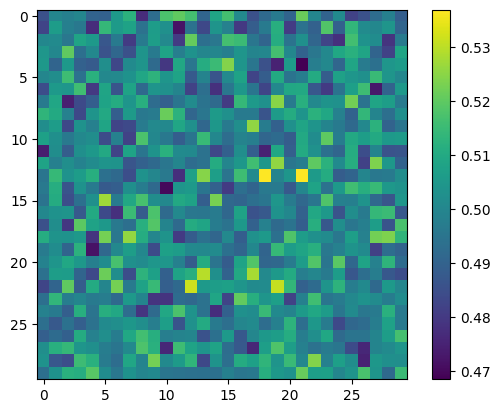

In [ ]:
x = tf.random.normal([1,256,256,3])
y = tf.random.uniform([1,256,256,3])

disc_out = Discriminator()(x, y)
plt.imshow(disc_out[0, ... ,0])
plt.colorbar()

In [ ]:
#손실 계산 정의
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

# Loss Function of Generator
def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

# Loss Funtion of Discriminator
def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

In [ ]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)

In [ ]:
# 중간 손실 값에 대한 로그 함수 구현
@tf.function
def train_step(sketch, real_colored):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
        # Generator 예측
        fake_colored = generator(sketch, training=True)
        # Discriminator 예측
        fake_disc = discriminator(sketch, fake_colored, training=True)
        real_disc = discriminator(sketch, real_colored, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_colored, real_colored, fake_disc)
        gene_total_loss = gene_loss + (100 * l1_loss) ## <===== L1 손실 반영 λ=100
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)

    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss

In [ ]:
# 스케치, 생성된 이미지, 실제 이미지 시각화 함수
def display_images(path, generator):

    display_count = 5

    for train_idx in range(len(os.listdir(path))):
        f = path + os.listdir(path)[train_idx]
        input_image, real_image = load_img(f)

        pred = generator(tf.expand_dims(input_image, 0))
        pred = denormalize(pred)

        plt.figure(figsize=(20, 10))

        plt.subplot(1, 3, 1)
        plt.axis('off')
        plt.imshow(denormalize(input_image))
        plt.title('Input Image', fontsize=20)

        plt.subplot(1, 3, 2)
        plt.axis('off')
        plt.imshow(pred[0])
        plt.title('Predicted Image', fontsize=20)

        plt.subplot(1, 3, 3)
        plt.axis('off')
        plt.imshow(denormalize(real_image))
        plt.title('Ground Truth', fontsize=20)

        plt.tight_layout()
        plt.show()

        # 이미지를 5개만 표시하고 반복문 종료
        display_count -= 1
        if display_count == 0:
            break

In [ ]:
# Loss 그래프 시각화 함수
def visualize_losses():
    fig, axes = plt.subplots(3, 1, figsize=(12, 18))  # 3개의 서브플롯을 생성
    axes = axes.ravel()  # 1차원 배열로 변환

    # Generator Loss 그래프
    axes[0].plot(generator_losses, label='Generator Loss', alpha=0.7, color='indigo')
    axes[0].set_xlabel('Step')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Generator Loss')
    axes[0].legend()

    # L1 Loss 그래프
    axes[1].plot(l1_losses, label='L1 Loss', alpha=0.7, color='royalblue')
    axes[1].set_xlabel('Step')
    axes[1].set_ylabel('Loss')
    axes[1].set_title('L1 Loss')
    axes[1].legend()

    # Discriminator Loss 그래프
    axes[2].plot(discriminator_losses, label='Discriminator Loss', alpha=0.7, color='skyblue')
    axes[2].set_xlabel('Step')
    axes[2].set_ylabel('Loss')
    axes[2].set_title('Discriminator Loss')
    axes[2].legend()

    plt.tight_layout()
    plt.show()


In [ ]:
# 손실을 저장할 리스트 초기화
generator_losses = []
l1_losses = []
discriminator_losses = []

def train(dataset, epochs):
    for epoch in range(1, epochs+1):
        for i, (sketch, colored) in enumerate(dataset):
            g_loss, l1_loss, d_loss = train_step(sketch, colored)

            # 손실 값을 리스트에 추가
            generator_losses.append(g_loss.numpy())
            l1_losses.append(l1_loss.numpy())
            discriminator_losses.append(d_loss.numpy())

            # 10회 반복마다 손실을 출력합니다.
            if (i+1) % 250 == 0:
                print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                        \nGenerator_loss:{g_loss.numpy():.4f} \
                        \nL1_loss:{l1_loss.numpy():.4f} \
                        \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

    visualize_losses()


# 5. 학습 및 손실함수에 대한 로그 시각화

EPOCH[1] - STEP[250]                         
Generator_loss:1.1786                         
L1_loss:0.1930                         
Discriminator_loss:0.9429

EPOCH[2] - STEP[250]                         
Generator_loss:0.4113                         
L1_loss:0.1827                         
Discriminator_loss:1.7177

EPOCH[3] - STEP[250]                         
Generator_loss:1.9557                         
L1_loss:0.1728                         
Discriminator_loss:1.0444

EPOCH[4] - STEP[250]                         
Generator_loss:0.4755                         
L1_loss:0.1778                         
Discriminator_loss:1.3138

EPOCH[5] - STEP[250]                         
Generator_loss:0.7051                         
L1_loss:0.2091                         
Discriminator_loss:0.9486

EPOCH[6] - STEP[250]                         
Generator_loss:1.5507                         
L1_loss:0.2161                         
Discriminator_loss:0.4163

EPOCH[7] - STEP[250]                    

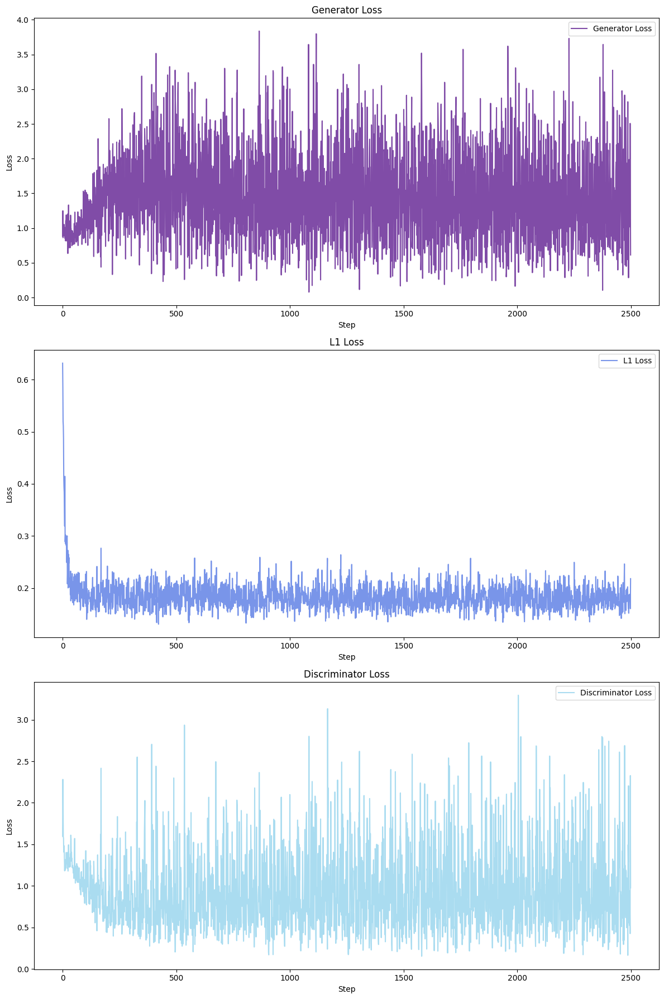

In [ ]:
train(train_images, 10)

# 6. 학습데이터 시각화

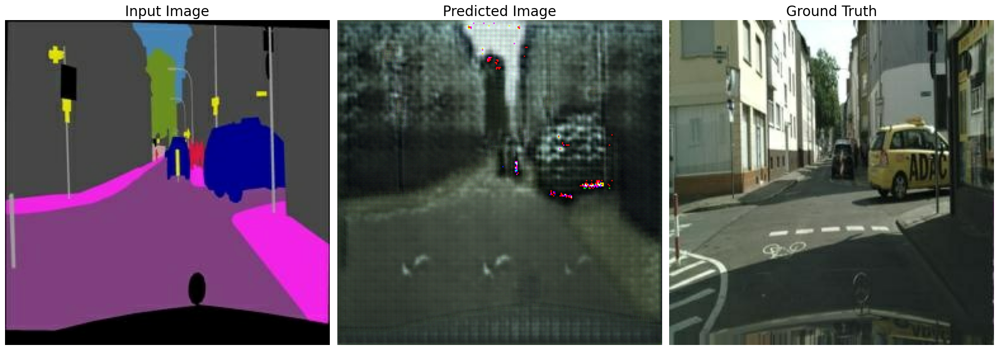

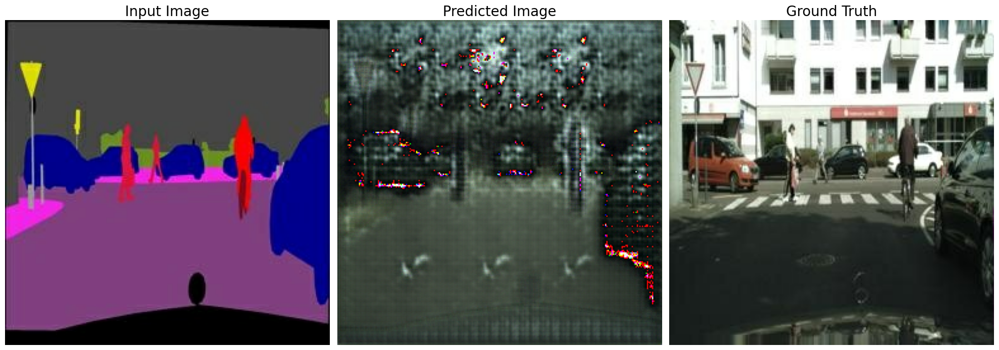

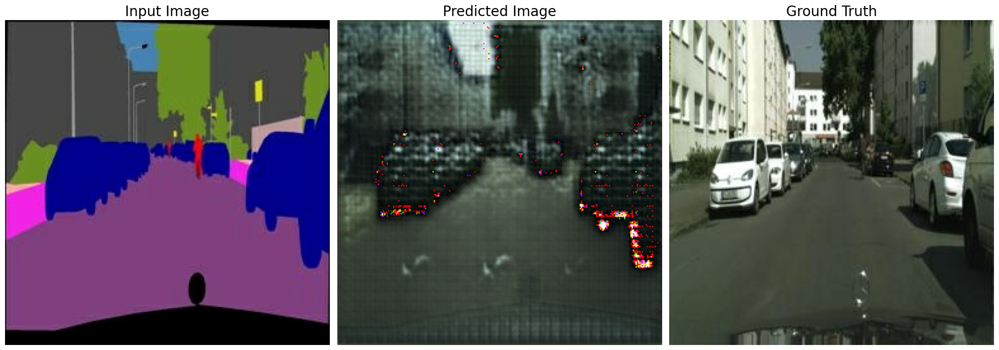

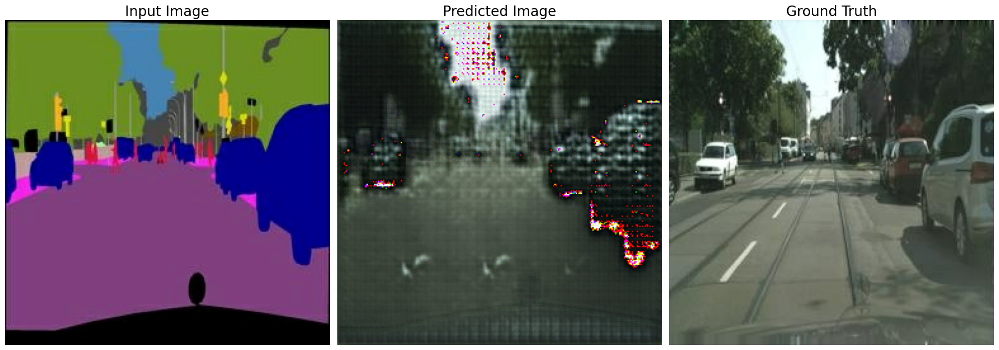

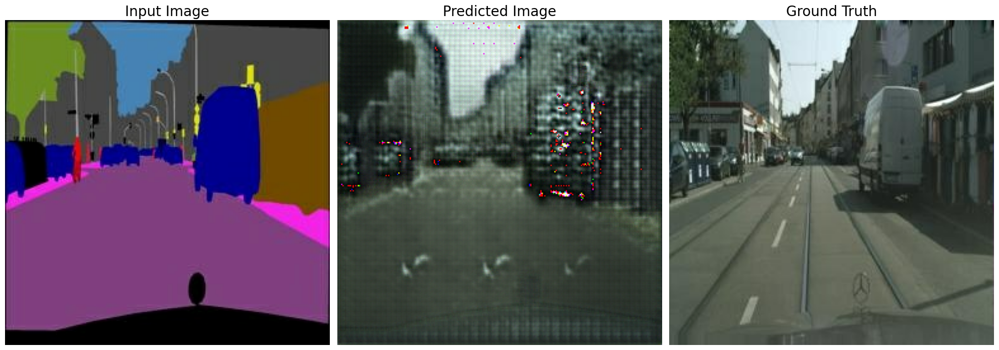

In [ ]:
test_path = "/content/drive/MyDrive/아이펠/EXPLORATION_RS6/data/cityscapes/val/"
display_images(test_path, generator)

# 7. 회고
- 적은 학습으로 인하여 결과값이 좋진 않았습니다.
